# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

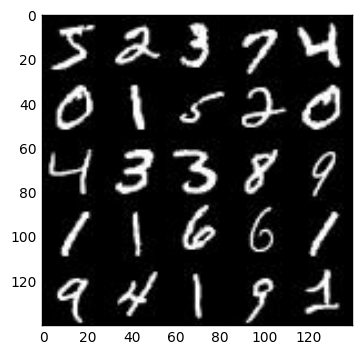

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

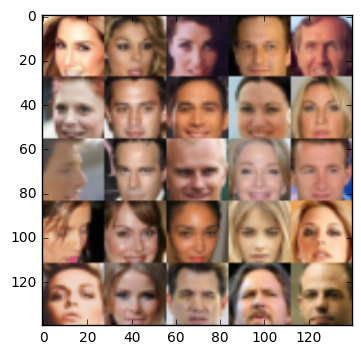

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_images = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels])
    z_tenzor = tf.placeholder(tf.float32, [None, z_dim], name='z_tensor')
    lr = tf.placeholder(tf.float32, name="learning_rate")

    return real_images, z_tenzor, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [6]:
def discriminator(images, reuse=False, alpha=0.1):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    
    with tf.variable_scope('discriminator', reuse=reuse):
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)

        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.1):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse=not is_train):
        
        x1 = tf.layers.dense(z, 7*7*1024)
        
        x1 = tf.reshape(x1, (-1, 7, 7, 1024))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d_transpose(x1, 512, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        
        x2 = tf.layers.conv2d_transpose(x2, 256, 5, strides=1, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        
        
        logits = tf.layers.conv2d_transpose(x2, out_channel_dim, 5, strides=2, padding='same')
        
        out = tf.tanh(logits)
        #print(out.shape)

    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    with tf.control_dependencies(update_ops):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode,
         print_every=10, show_every=100, alpha=0.1):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    #saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(50, z_dim))

    samples, losses = [], []
    steps = 0
    
    input_real, input_z, lr = model_inputs(
            *data_shape[1:],
            z_dim)
    


    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3], alpha=alpha)

    
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):

                steps += 1
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                
                sess.run(g_opt, feed_dict={input_z: batch_z, lr: learning_rate/2, input_real: batch_images})
                sess.run(g_opt, feed_dict={input_z: batch_z, lr: learning_rate/2, input_real: batch_images})
                
                if steps % print_every == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                    losses.append((train_loss_d, train_loss_g))
                    
                if steps % show_every == 0:
                    #gen_samples = sess.run(
                    #               generator(input_z, 3, reuse=True),
                    #               feed_dict={input_z: sample_z})
                    
                    #samples.append(gen_samples)
                    #_ = view_samples(-1, samples, 5, 10, figsize=figsize)
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
                    #plt.show()
                    
                    
        #saver.save(sess, './checkpoints/generator.ckpt')

    #with open('samples.pkl', 'wb') as f:
    #    pkl.dump(samples, f)
    
    return losses, samples        

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 2.6713... Generator Loss: 0.1130
Epoch 1/2... Discriminator Loss: 2.6371... Generator Loss: 0.1784
Epoch 1/2... Discriminator Loss: 2.6572... Generator Loss: 0.1673
Epoch 1/2... Discriminator Loss: 2.0566... Generator Loss: 0.2718
Epoch 1/2... Discriminator Loss: 2.1003... Generator Loss: 0.2353
Epoch 1/2... Discriminator Loss: 1.6727... Generator Loss: 0.4272
Epoch 1/2... Discriminator Loss: 1.3443... Generator Loss: 1.1713
Epoch 1/2... Discriminator Loss: 1.5344... Generator Loss: 0.4099
Epoch 1/2... Discriminator Loss: 1.3460... Generator Loss: 0.7173
Epoch 1/2... Discriminator Loss: 1.2521... Generator Loss: 0.7037


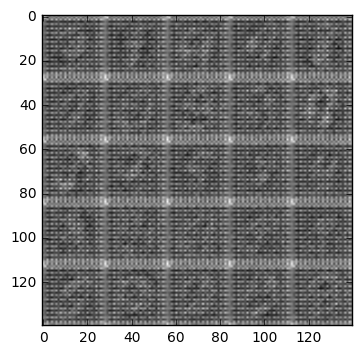

Epoch 1/2... Discriminator Loss: 1.2297... Generator Loss: 0.5164
Epoch 1/2... Discriminator Loss: 1.3816... Generator Loss: 0.4225
Epoch 1/2... Discriminator Loss: 1.3995... Generator Loss: 0.3548
Epoch 1/2... Discriminator Loss: 1.2639... Generator Loss: 0.4191
Epoch 1/2... Discriminator Loss: 1.3340... Generator Loss: 0.5216
Epoch 1/2... Discriminator Loss: 1.4177... Generator Loss: 0.4411
Epoch 1/2... Discriminator Loss: 0.7657... Generator Loss: 1.3084
Epoch 1/2... Discriminator Loss: 1.0295... Generator Loss: 2.3717
Epoch 1/2... Discriminator Loss: 0.8401... Generator Loss: 1.0949
Epoch 1/2... Discriminator Loss: 1.0396... Generator Loss: 0.7491


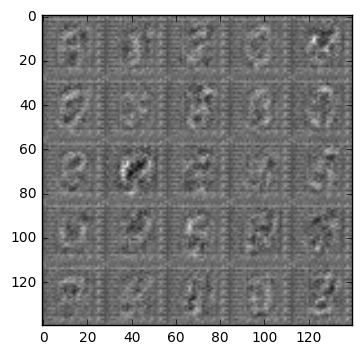

Epoch 1/2... Discriminator Loss: 1.1116... Generator Loss: 0.5890
Epoch 1/2... Discriminator Loss: 1.0526... Generator Loss: 0.6517
Epoch 1/2... Discriminator Loss: 0.7619... Generator Loss: 1.2815
Epoch 1/2... Discriminator Loss: 0.9465... Generator Loss: 1.4813
Epoch 1/2... Discriminator Loss: 1.3628... Generator Loss: 0.3534
Epoch 1/2... Discriminator Loss: 0.9018... Generator Loss: 0.7373
Epoch 1/2... Discriminator Loss: 0.8158... Generator Loss: 0.9633
Epoch 1/2... Discriminator Loss: 1.0761... Generator Loss: 0.5348
Epoch 1/2... Discriminator Loss: 1.0650... Generator Loss: 0.5700
Epoch 1/2... Discriminator Loss: 0.6267... Generator Loss: 1.8646


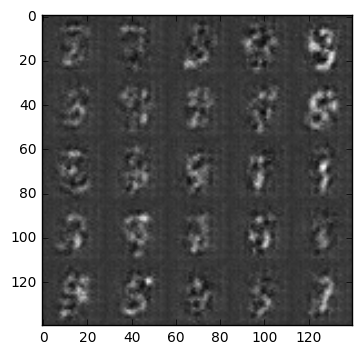

Epoch 1/2... Discriminator Loss: 0.9774... Generator Loss: 0.5886
Epoch 1/2... Discriminator Loss: 0.6016... Generator Loss: 1.3246
Epoch 1/2... Discriminator Loss: 0.8066... Generator Loss: 0.7616
Epoch 1/2... Discriminator Loss: 0.8063... Generator Loss: 0.7784
Epoch 1/2... Discriminator Loss: 1.0834... Generator Loss: 3.1394
Epoch 1/2... Discriminator Loss: 1.0301... Generator Loss: 0.5752
Epoch 1/2... Discriminator Loss: 0.8353... Generator Loss: 0.8721
Epoch 1/2... Discriminator Loss: 0.5649... Generator Loss: 1.2942
Epoch 1/2... Discriminator Loss: 0.6285... Generator Loss: 1.2775
Epoch 1/2... Discriminator Loss: 1.4139... Generator Loss: 0.3326


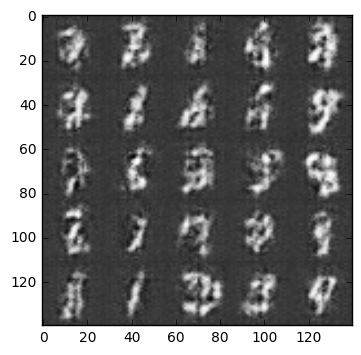

Epoch 1/2... Discriminator Loss: 1.0237... Generator Loss: 0.5312
Epoch 1/2... Discriminator Loss: 0.9533... Generator Loss: 0.8248
Epoch 1/2... Discriminator Loss: 0.7237... Generator Loss: 0.8858
Epoch 1/2... Discriminator Loss: 0.6758... Generator Loss: 1.0143
Epoch 1/2... Discriminator Loss: 0.6736... Generator Loss: 0.9323
Epoch 1/2... Discriminator Loss: 1.5995... Generator Loss: 0.2642
Epoch 1/2... Discriminator Loss: 0.7157... Generator Loss: 1.3019
Epoch 1/2... Discriminator Loss: 1.8748... Generator Loss: 0.1910
Epoch 1/2... Discriminator Loss: 1.5107... Generator Loss: 0.2944
Epoch 1/2... Discriminator Loss: 1.9041... Generator Loss: 0.1989


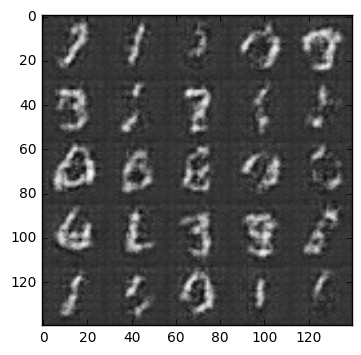

Epoch 1/2... Discriminator Loss: 0.8132... Generator Loss: 0.7821
Epoch 1/2... Discriminator Loss: 0.6324... Generator Loss: 2.0653
Epoch 1/2... Discriminator Loss: 0.9197... Generator Loss: 3.0295
Epoch 1/2... Discriminator Loss: 0.7132... Generator Loss: 0.9349
Epoch 1/2... Discriminator Loss: 1.3089... Generator Loss: 0.3849
Epoch 1/2... Discriminator Loss: 0.4969... Generator Loss: 2.0802
Epoch 1/2... Discriminator Loss: 0.8366... Generator Loss: 0.7724
Epoch 1/2... Discriminator Loss: 1.5364... Generator Loss: 0.3021
Epoch 1/2... Discriminator Loss: 1.6678... Generator Loss: 0.2483
Epoch 1/2... Discriminator Loss: 1.0691... Generator Loss: 0.5733


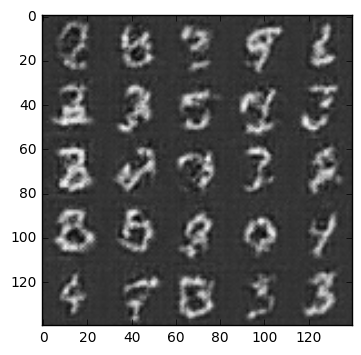

Epoch 1/2... Discriminator Loss: 0.6888... Generator Loss: 1.2720
Epoch 1/2... Discriminator Loss: 1.0331... Generator Loss: 2.3098
Epoch 1/2... Discriminator Loss: 1.0872... Generator Loss: 0.4960
Epoch 1/2... Discriminator Loss: 0.6718... Generator Loss: 0.9006
Epoch 1/2... Discriminator Loss: 0.8173... Generator Loss: 0.8227
Epoch 1/2... Discriminator Loss: 0.5684... Generator Loss: 2.2865
Epoch 1/2... Discriminator Loss: 1.0702... Generator Loss: 0.5199
Epoch 1/2... Discriminator Loss: 0.5720... Generator Loss: 1.3459
Epoch 1/2... Discriminator Loss: 0.5845... Generator Loss: 1.2159
Epoch 1/2... Discriminator Loss: 0.5578... Generator Loss: 1.2776


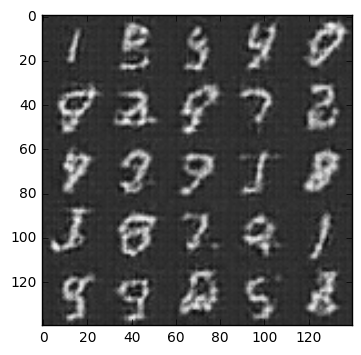

Epoch 1/2... Discriminator Loss: 1.4763... Generator Loss: 0.3171
Epoch 1/2... Discriminator Loss: 2.8141... Generator Loss: 0.0740
Epoch 1/2... Discriminator Loss: 0.5929... Generator Loss: 1.3744
Epoch 1/2... Discriminator Loss: 0.8980... Generator Loss: 0.6941
Epoch 1/2... Discriminator Loss: 0.8841... Generator Loss: 0.7446
Epoch 1/2... Discriminator Loss: 1.1876... Generator Loss: 0.4776
Epoch 1/2... Discriminator Loss: 2.4050... Generator Loss: 0.1085
Epoch 1/2... Discriminator Loss: 0.4308... Generator Loss: 2.2386
Epoch 1/2... Discriminator Loss: 0.6854... Generator Loss: 0.9855
Epoch 1/2... Discriminator Loss: 1.4252... Generator Loss: 0.3361


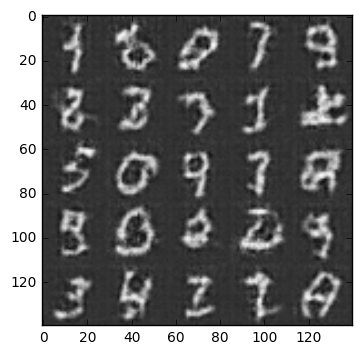

Epoch 1/2... Discriminator Loss: 0.9281... Generator Loss: 0.6356
Epoch 1/2... Discriminator Loss: 0.5012... Generator Loss: 3.2212
Epoch 1/2... Discriminator Loss: 1.3134... Generator Loss: 0.3938
Epoch 1/2... Discriminator Loss: 0.4350... Generator Loss: 1.7892
Epoch 1/2... Discriminator Loss: 1.3175... Generator Loss: 2.7348
Epoch 1/2... Discriminator Loss: 0.8478... Generator Loss: 0.7486
Epoch 1/2... Discriminator Loss: 0.8831... Generator Loss: 3.5126
Epoch 1/2... Discriminator Loss: 1.2976... Generator Loss: 0.3957
Epoch 1/2... Discriminator Loss: 0.3847... Generator Loss: 1.4845
Epoch 1/2... Discriminator Loss: 0.4902... Generator Loss: 1.5608


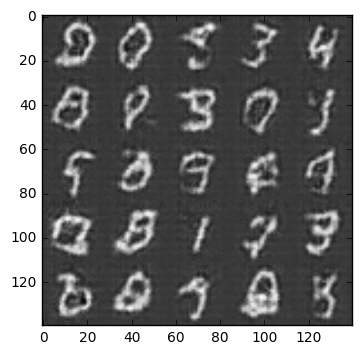

Epoch 1/2... Discriminator Loss: 0.5117... Generator Loss: 1.2262
Epoch 1/2... Discriminator Loss: 1.6261... Generator Loss: 0.2444
Epoch 1/2... Discriminator Loss: 0.7159... Generator Loss: 0.9279
Epoch 2/2... Discriminator Loss: 2.1079... Generator Loss: 0.1544
Epoch 2/2... Discriminator Loss: 0.8546... Generator Loss: 2.5302
Epoch 2/2... Discriminator Loss: 0.4993... Generator Loss: 1.4067
Epoch 2/2... Discriminator Loss: 0.6723... Generator Loss: 1.1887
Epoch 2/2... Discriminator Loss: 0.7154... Generator Loss: 0.9046
Epoch 2/2... Discriminator Loss: 0.5027... Generator Loss: 2.9557
Epoch 2/2... Discriminator Loss: 0.9692... Generator Loss: 0.6544


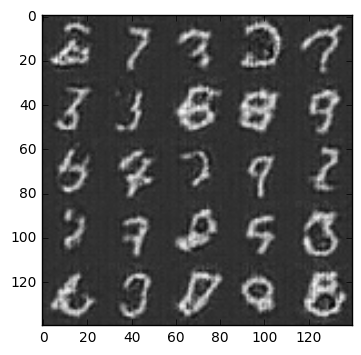

Epoch 2/2... Discriminator Loss: 1.3242... Generator Loss: 0.3742
Epoch 2/2... Discriminator Loss: 1.4676... Generator Loss: 0.3293
Epoch 2/2... Discriminator Loss: 0.7866... Generator Loss: 0.8130
Epoch 2/2... Discriminator Loss: 0.4235... Generator Loss: 1.3798
Epoch 2/2... Discriminator Loss: 0.5931... Generator Loss: 1.7086
Epoch 2/2... Discriminator Loss: 1.0936... Generator Loss: 0.5698
Epoch 2/2... Discriminator Loss: 1.1763... Generator Loss: 0.5164
Epoch 2/2... Discriminator Loss: 0.6686... Generator Loss: 1.0316
Epoch 2/2... Discriminator Loss: 1.0615... Generator Loss: 0.4969
Epoch 2/2... Discriminator Loss: 1.2146... Generator Loss: 0.4615


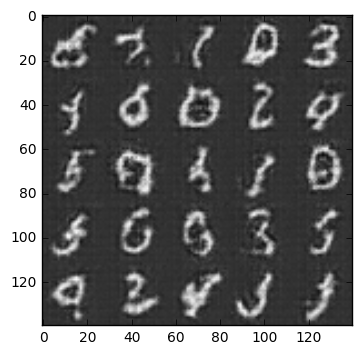

Epoch 2/2... Discriminator Loss: 0.8494... Generator Loss: 0.7516
Epoch 2/2... Discriminator Loss: 0.6630... Generator Loss: 1.0425
Epoch 2/2... Discriminator Loss: 0.7954... Generator Loss: 0.8649
Epoch 2/2... Discriminator Loss: 1.7965... Generator Loss: 0.2119
Epoch 2/2... Discriminator Loss: 1.4244... Generator Loss: 0.3522
Epoch 2/2... Discriminator Loss: 0.9056... Generator Loss: 0.6907
Epoch 2/2... Discriminator Loss: 0.9638... Generator Loss: 0.6317
Epoch 2/2... Discriminator Loss: 1.2646... Generator Loss: 0.4091
Epoch 2/2... Discriminator Loss: 1.3650... Generator Loss: 0.3772
Epoch 2/2... Discriminator Loss: 1.1440... Generator Loss: 0.5016


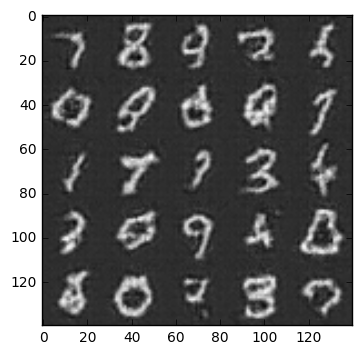

Epoch 2/2... Discriminator Loss: 0.3123... Generator Loss: 1.8873
Epoch 2/2... Discriminator Loss: 0.5810... Generator Loss: 1.2578
Epoch 2/2... Discriminator Loss: 0.3151... Generator Loss: 1.7535
Epoch 2/2... Discriminator Loss: 0.7639... Generator Loss: 0.8459
Epoch 2/2... Discriminator Loss: 0.2743... Generator Loss: 1.9939
Epoch 2/2... Discriminator Loss: 0.7309... Generator Loss: 0.9233
Epoch 2/2... Discriminator Loss: 0.7294... Generator Loss: 0.8158
Epoch 2/2... Discriminator Loss: 0.3190... Generator Loss: 1.8247
Epoch 2/2... Discriminator Loss: 0.5166... Generator Loss: 1.9890
Epoch 2/2... Discriminator Loss: 0.9616... Generator Loss: 0.6203


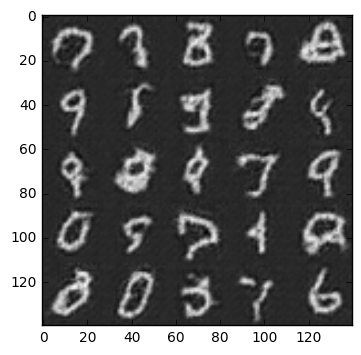

Epoch 2/2... Discriminator Loss: 1.6940... Generator Loss: 0.2838
Epoch 2/2... Discriminator Loss: 0.3539... Generator Loss: 1.5525
Epoch 2/2... Discriminator Loss: 0.6423... Generator Loss: 1.0811
Epoch 2/2... Discriminator Loss: 0.5293... Generator Loss: 1.1570
Epoch 2/2... Discriminator Loss: 0.8935... Generator Loss: 0.6743
Epoch 2/2... Discriminator Loss: 0.5403... Generator Loss: 1.5070
Epoch 2/2... Discriminator Loss: 0.8049... Generator Loss: 1.0972
Epoch 2/2... Discriminator Loss: 0.8069... Generator Loss: 0.8024
Epoch 2/2... Discriminator Loss: 1.3990... Generator Loss: 0.3664
Epoch 2/2... Discriminator Loss: 0.8182... Generator Loss: 0.8182


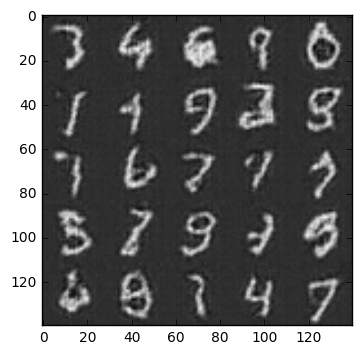

Epoch 2/2... Discriminator Loss: 0.9705... Generator Loss: 0.6044
Epoch 2/2... Discriminator Loss: 0.4851... Generator Loss: 1.2596
Epoch 2/2... Discriminator Loss: 0.7594... Generator Loss: 0.8609
Epoch 2/2... Discriminator Loss: 2.4330... Generator Loss: 0.1233
Epoch 2/2... Discriminator Loss: 0.6921... Generator Loss: 1.0529
Epoch 2/2... Discriminator Loss: 0.4301... Generator Loss: 1.3070
Epoch 2/2... Discriminator Loss: 0.9928... Generator Loss: 0.5984
Epoch 2/2... Discriminator Loss: 1.5957... Generator Loss: 0.2728
Epoch 2/2... Discriminator Loss: 0.7826... Generator Loss: 0.8264
Epoch 2/2... Discriminator Loss: 0.6829... Generator Loss: 0.9755


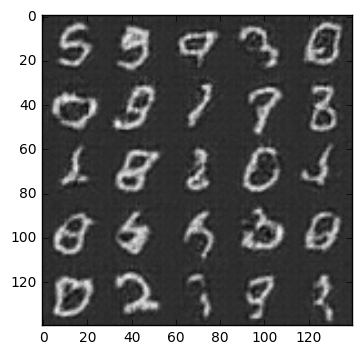

Epoch 2/2... Discriminator Loss: 0.4969... Generator Loss: 1.7432
Epoch 2/2... Discriminator Loss: 1.6178... Generator Loss: 0.2635
Epoch 2/2... Discriminator Loss: 0.7527... Generator Loss: 0.8485
Epoch 2/2... Discriminator Loss: 0.3680... Generator Loss: 1.5446
Epoch 2/2... Discriminator Loss: 0.4782... Generator Loss: 1.3326
Epoch 2/2... Discriminator Loss: 0.4193... Generator Loss: 1.6940
Epoch 2/2... Discriminator Loss: 0.3193... Generator Loss: 2.4737
Epoch 2/2... Discriminator Loss: 1.1313... Generator Loss: 0.4924
Epoch 2/2... Discriminator Loss: 0.8897... Generator Loss: 4.6957
Epoch 2/2... Discriminator Loss: 0.8678... Generator Loss: 0.7007


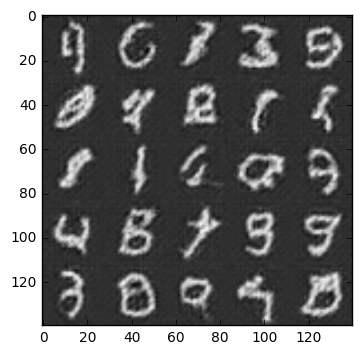

Epoch 2/2... Discriminator Loss: 1.0471... Generator Loss: 0.6139
Epoch 2/2... Discriminator Loss: 0.6995... Generator Loss: 0.9963
Epoch 2/2... Discriminator Loss: 0.4583... Generator Loss: 1.3009
Epoch 2/2... Discriminator Loss: 1.2822... Generator Loss: 0.4867
Epoch 2/2... Discriminator Loss: 0.9647... Generator Loss: 0.6358
Epoch 2/2... Discriminator Loss: 1.5472... Generator Loss: 0.3186
Epoch 2/2... Discriminator Loss: 0.7263... Generator Loss: 0.8668
Epoch 2/2... Discriminator Loss: 0.6259... Generator Loss: 1.2216
Epoch 2/2... Discriminator Loss: 0.4204... Generator Loss: 1.7272
Epoch 2/2... Discriminator Loss: 1.6560... Generator Loss: 3.6087


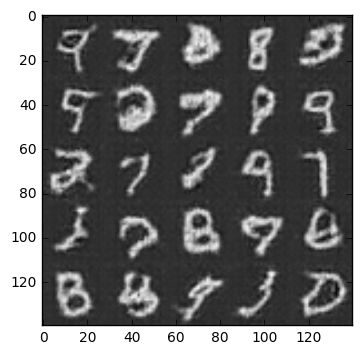

Epoch 2/2... Discriminator Loss: 1.2163... Generator Loss: 0.4582
Epoch 2/2... Discriminator Loss: 0.8768... Generator Loss: 0.6775
Epoch 2/2... Discriminator Loss: 1.0709... Generator Loss: 0.5639
Epoch 2/2... Discriminator Loss: 0.5691... Generator Loss: 1.0536
Epoch 2/2... Discriminator Loss: 0.4738... Generator Loss: 2.1576
Epoch 2/2... Discriminator Loss: 0.4389... Generator Loss: 1.2800
Epoch 2/2... Discriminator Loss: 0.3988... Generator Loss: 1.4493
Epoch 2/2... Discriminator Loss: 0.8725... Generator Loss: 0.6812
Epoch 2/2... Discriminator Loss: 1.2427... Generator Loss: 0.4232
Epoch 2/2... Discriminator Loss: 0.3073... Generator Loss: 1.9294


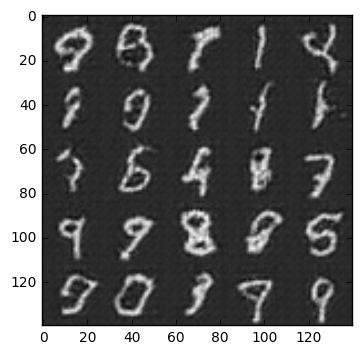

Epoch 2/2... Discriminator Loss: 0.7613... Generator Loss: 0.9936
Epoch 2/2... Discriminator Loss: 0.4491... Generator Loss: 1.9724
Epoch 2/2... Discriminator Loss: 0.7434... Generator Loss: 4.1287
Epoch 2/2... Discriminator Loss: 0.4916... Generator Loss: 2.0253
Epoch 2/2... Discriminator Loss: 1.4531... Generator Loss: 0.3421
Epoch 2/2... Discriminator Loss: 0.2672... Generator Loss: 1.8850
Epoch 2/2... Discriminator Loss: 0.7902... Generator Loss: 0.7531


In [12]:
batch_size = 64
z_dim = 100
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 2.4692... Generator Loss: 6.2439
Epoch 1/1... Discriminator Loss: 2.8856... Generator Loss: 2.3498
Epoch 1/1... Discriminator Loss: 1.9420... Generator Loss: 0.4130
Epoch 1/1... Discriminator Loss: 1.0851... Generator Loss: 0.5089
Epoch 1/1... Discriminator Loss: 1.1976... Generator Loss: 0.4814
Epoch 1/1... Discriminator Loss: 0.6616... Generator Loss: 0.9105
Epoch 1/1... Discriminator Loss: 0.4151... Generator Loss: 1.3507
Epoch 1/1... Discriminator Loss: 1.2413... Generator Loss: 0.8074
Epoch 1/1... Discriminator Loss: 1.4909... Generator Loss: 0.3827
Epoch 1/1... Discriminator Loss: 1.0924... Generator Loss: 0.6777


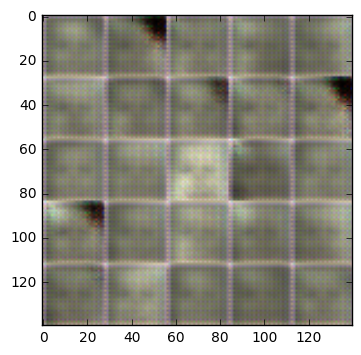

Epoch 1/1... Discriminator Loss: 0.7304... Generator Loss: 1.6595
Epoch 1/1... Discriminator Loss: 1.6992... Generator Loss: 0.3154
Epoch 1/1... Discriminator Loss: 0.4938... Generator Loss: 1.2917
Epoch 1/1... Discriminator Loss: 1.5036... Generator Loss: 0.3657
Epoch 1/1... Discriminator Loss: 0.5134... Generator Loss: 1.7820
Epoch 1/1... Discriminator Loss: 1.0802... Generator Loss: 0.5141
Epoch 1/1... Discriminator Loss: 0.4071... Generator Loss: 1.4907
Epoch 1/1... Discriminator Loss: 0.6596... Generator Loss: 2.8707
Epoch 1/1... Discriminator Loss: 0.2819... Generator Loss: 1.7242
Epoch 1/1... Discriminator Loss: 1.3931... Generator Loss: 2.2505


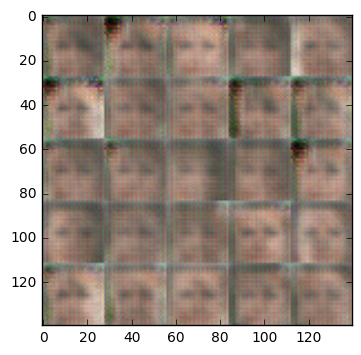

Epoch 1/1... Discriminator Loss: 0.9281... Generator Loss: 0.7409
Epoch 1/1... Discriminator Loss: 2.6894... Generator Loss: 0.3163
Epoch 1/1... Discriminator Loss: 1.5083... Generator Loss: 1.1614
Epoch 1/1... Discriminator Loss: 1.6765... Generator Loss: 0.7699
Epoch 1/1... Discriminator Loss: 1.4760... Generator Loss: 0.5949
Epoch 1/1... Discriminator Loss: 1.5404... Generator Loss: 0.6262
Epoch 1/1... Discriminator Loss: 1.4463... Generator Loss: 0.6916
Epoch 1/1... Discriminator Loss: 1.6537... Generator Loss: 0.5772
Epoch 1/1... Discriminator Loss: 1.5384... Generator Loss: 0.5584
Epoch 1/1... Discriminator Loss: 1.6172... Generator Loss: 0.5832


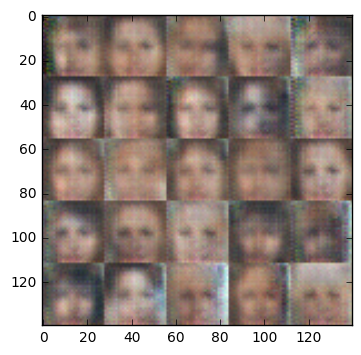

Epoch 1/1... Discriminator Loss: 1.5400... Generator Loss: 0.6274
Epoch 1/1... Discriminator Loss: 1.5170... Generator Loss: 0.6634
Epoch 1/1... Discriminator Loss: 1.5464... Generator Loss: 0.6203
Epoch 1/1... Discriminator Loss: 1.7681... Generator Loss: 0.5251
Epoch 1/1... Discriminator Loss: 1.6309... Generator Loss: 0.5736
Epoch 1/1... Discriminator Loss: 1.5399... Generator Loss: 0.5624
Epoch 1/1... Discriminator Loss: 1.4380... Generator Loss: 0.6539
Epoch 1/1... Discriminator Loss: 1.4711... Generator Loss: 0.5847
Epoch 1/1... Discriminator Loss: 1.5451... Generator Loss: 0.5816
Epoch 1/1... Discriminator Loss: 1.6639... Generator Loss: 0.6384


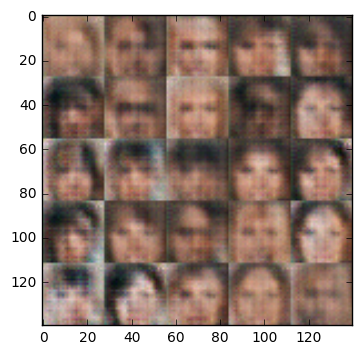

Epoch 1/1... Discriminator Loss: 1.5676... Generator Loss: 0.6101
Epoch 1/1... Discriminator Loss: 1.7133... Generator Loss: 0.5900
Epoch 1/1... Discriminator Loss: 1.4696... Generator Loss: 0.6151
Epoch 1/1... Discriminator Loss: 1.5397... Generator Loss: 0.5835
Epoch 1/1... Discriminator Loss: 1.4513... Generator Loss: 0.6894
Epoch 1/1... Discriminator Loss: 1.3999... Generator Loss: 0.6779
Epoch 1/1... Discriminator Loss: 1.4918... Generator Loss: 0.6221
Epoch 1/1... Discriminator Loss: 1.4420... Generator Loss: 0.7446
Epoch 1/1... Discriminator Loss: 1.4551... Generator Loss: 0.6611
Epoch 1/1... Discriminator Loss: 1.4426... Generator Loss: 0.6306


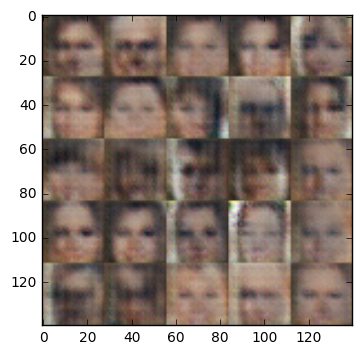

Epoch 1/1... Discriminator Loss: 1.4589... Generator Loss: 0.6686
Epoch 1/1... Discriminator Loss: 1.4913... Generator Loss: 0.6137
Epoch 1/1... Discriminator Loss: 1.5669... Generator Loss: 0.6399
Epoch 1/1... Discriminator Loss: 1.4424... Generator Loss: 0.6220
Epoch 1/1... Discriminator Loss: 1.5786... Generator Loss: 0.6518
Epoch 1/1... Discriminator Loss: 1.6098... Generator Loss: 0.5921
Epoch 1/1... Discriminator Loss: 1.5564... Generator Loss: 0.6019
Epoch 1/1... Discriminator Loss: 1.4779... Generator Loss: 0.6280
Epoch 1/1... Discriminator Loss: 1.3221... Generator Loss: 1.0223
Epoch 1/1... Discriminator Loss: 1.5818... Generator Loss: 0.5485


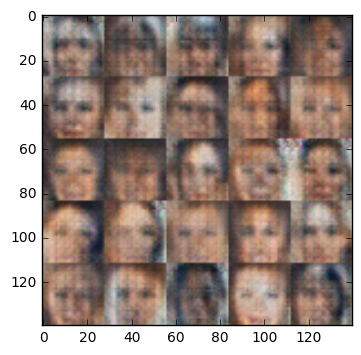

Epoch 1/1... Discriminator Loss: 1.3971... Generator Loss: 0.6295
Epoch 1/1... Discriminator Loss: 1.5628... Generator Loss: 0.5796
Epoch 1/1... Discriminator Loss: 1.5242... Generator Loss: 0.4792
Epoch 1/1... Discriminator Loss: 1.4682... Generator Loss: 0.6183
Epoch 1/1... Discriminator Loss: 1.4596... Generator Loss: 0.7388
Epoch 1/1... Discriminator Loss: 1.4524... Generator Loss: 0.6496
Epoch 1/1... Discriminator Loss: 1.4613... Generator Loss: 0.7183
Epoch 1/1... Discriminator Loss: 1.6049... Generator Loss: 0.5533
Epoch 1/1... Discriminator Loss: 1.4538... Generator Loss: 0.7179
Epoch 1/1... Discriminator Loss: 1.5815... Generator Loss: 0.5248


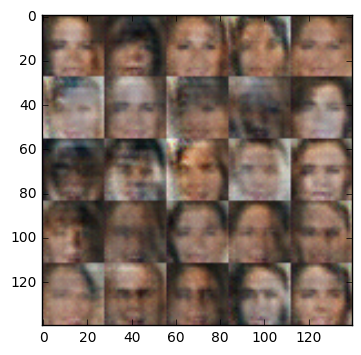

Epoch 1/1... Discriminator Loss: 1.5592... Generator Loss: 0.7105
Epoch 1/1... Discriminator Loss: 1.6024... Generator Loss: 0.5725
Epoch 1/1... Discriminator Loss: 1.6329... Generator Loss: 0.5994
Epoch 1/1... Discriminator Loss: 2.1881... Generator Loss: 0.1347
Epoch 1/1... Discriminator Loss: 1.2792... Generator Loss: 0.7227
Epoch 1/1... Discriminator Loss: 1.5584... Generator Loss: 0.5428
Epoch 1/1... Discriminator Loss: 0.8434... Generator Loss: 1.3041
Epoch 1/1... Discriminator Loss: 0.0924... Generator Loss: 4.5202
Epoch 1/1... Discriminator Loss: 1.1296... Generator Loss: 1.5595
Epoch 1/1... Discriminator Loss: 1.7365... Generator Loss: 0.6628


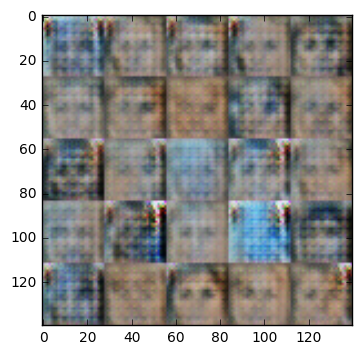

Epoch 1/1... Discriminator Loss: 1.7143... Generator Loss: 0.5732
Epoch 1/1... Discriminator Loss: 1.5579... Generator Loss: 0.7497
Epoch 1/1... Discriminator Loss: 1.7268... Generator Loss: 0.5173
Epoch 1/1... Discriminator Loss: 1.6506... Generator Loss: 0.5242
Epoch 1/1... Discriminator Loss: 1.3996... Generator Loss: 0.6979
Epoch 1/1... Discriminator Loss: 1.5452... Generator Loss: 0.6563
Epoch 1/1... Discriminator Loss: 1.4234... Generator Loss: 0.6481
Epoch 1/1... Discriminator Loss: 1.1821... Generator Loss: 0.9406
Epoch 1/1... Discriminator Loss: 1.4931... Generator Loss: 0.6720
Epoch 1/1... Discriminator Loss: 1.4084... Generator Loss: 0.6896


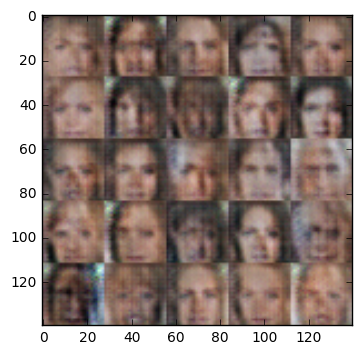

Epoch 1/1... Discriminator Loss: 1.2048... Generator Loss: 1.2998
Epoch 1/1... Discriminator Loss: 1.3687... Generator Loss: 0.5318
Epoch 1/1... Discriminator Loss: 1.6239... Generator Loss: 0.3961
Epoch 1/1... Discriminator Loss: 1.1768... Generator Loss: 1.5044
Epoch 1/1... Discriminator Loss: 0.5487... Generator Loss: 1.8361
Epoch 1/1... Discriminator Loss: 1.4471... Generator Loss: 0.6495
Epoch 1/1... Discriminator Loss: 1.2756... Generator Loss: 0.4892
Epoch 1/1... Discriminator Loss: 1.0976... Generator Loss: 0.8731
Epoch 1/1... Discriminator Loss: 1.3107... Generator Loss: 0.3858
Epoch 1/1... Discriminator Loss: 2.2144... Generator Loss: 0.2844


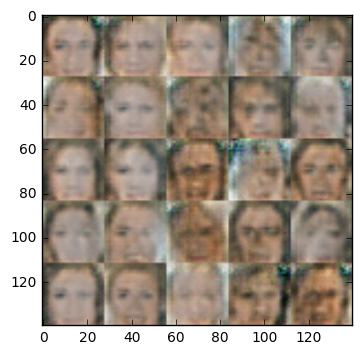

Epoch 1/1... Discriminator Loss: 1.4086... Generator Loss: 0.5695
Epoch 1/1... Discriminator Loss: 1.5019... Generator Loss: 0.5730
Epoch 1/1... Discriminator Loss: 1.5723... Generator Loss: 0.6672
Epoch 1/1... Discriminator Loss: 1.5290... Generator Loss: 0.5943
Epoch 1/1... Discriminator Loss: 1.5822... Generator Loss: 0.5493
Epoch 1/1... Discriminator Loss: 1.4559... Generator Loss: 0.6501
Epoch 1/1... Discriminator Loss: 1.4379... Generator Loss: 0.7002
Epoch 1/1... Discriminator Loss: 1.4969... Generator Loss: 0.6516
Epoch 1/1... Discriminator Loss: 1.4787... Generator Loss: 0.6468
Epoch 1/1... Discriminator Loss: 1.5298... Generator Loss: 0.6275


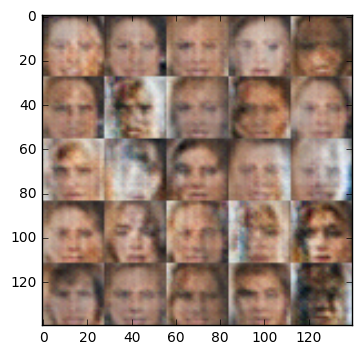

Epoch 1/1... Discriminator Loss: 1.4982... Generator Loss: 0.6613
Epoch 1/1... Discriminator Loss: 1.4153... Generator Loss: 0.6977
Epoch 1/1... Discriminator Loss: 1.4771... Generator Loss: 0.6628
Epoch 1/1... Discriminator Loss: 1.3860... Generator Loss: 0.6231
Epoch 1/1... Discriminator Loss: 1.4197... Generator Loss: 0.6132
Epoch 1/1... Discriminator Loss: 1.5630... Generator Loss: 0.6344
Epoch 1/1... Discriminator Loss: 1.4883... Generator Loss: 0.6570
Epoch 1/1... Discriminator Loss: 1.4527... Generator Loss: 0.5956
Epoch 1/1... Discriminator Loss: 1.6243... Generator Loss: 0.6726
Epoch 1/1... Discriminator Loss: 1.4555... Generator Loss: 0.6151


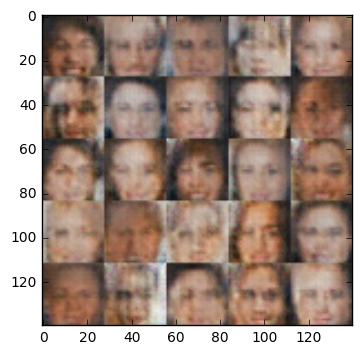

Epoch 1/1... Discriminator Loss: 1.4989... Generator Loss: 0.5709
Epoch 1/1... Discriminator Loss: 1.4930... Generator Loss: 0.7179
Epoch 1/1... Discriminator Loss: 1.4399... Generator Loss: 0.6371
Epoch 1/1... Discriminator Loss: 1.4770... Generator Loss: 0.5550
Epoch 1/1... Discriminator Loss: 1.4117... Generator Loss: 0.5994
Epoch 1/1... Discriminator Loss: 1.5338... Generator Loss: 0.7381
Epoch 1/1... Discriminator Loss: 1.4743... Generator Loss: 0.6338
Epoch 1/1... Discriminator Loss: 1.5396... Generator Loss: 0.7201
Epoch 1/1... Discriminator Loss: 1.4256... Generator Loss: 0.6512
Epoch 1/1... Discriminator Loss: 1.4639... Generator Loss: 0.6376


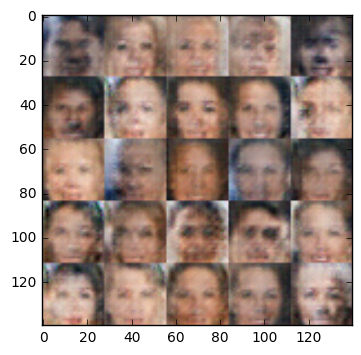

Epoch 1/1... Discriminator Loss: 1.5957... Generator Loss: 0.6361
Epoch 1/1... Discriminator Loss: 1.5060... Generator Loss: 0.6897
Epoch 1/1... Discriminator Loss: 1.4401... Generator Loss: 0.5539
Epoch 1/1... Discriminator Loss: 1.4498... Generator Loss: 0.6447
Epoch 1/1... Discriminator Loss: 1.3584... Generator Loss: 0.6465
Epoch 1/1... Discriminator Loss: 1.5532... Generator Loss: 0.6242
Epoch 1/1... Discriminator Loss: 1.4339... Generator Loss: 0.5894
Epoch 1/1... Discriminator Loss: 1.4926... Generator Loss: 0.6292
Epoch 1/1... Discriminator Loss: 1.5135... Generator Loss: 0.6979
Epoch 1/1... Discriminator Loss: 1.4627... Generator Loss: 0.5950


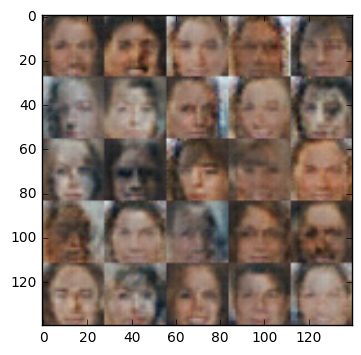

Epoch 1/1... Discriminator Loss: 1.4429... Generator Loss: 0.5792
Epoch 1/1... Discriminator Loss: 1.4340... Generator Loss: 0.6946
Epoch 1/1... Discriminator Loss: 1.4667... Generator Loss: 0.6444
Epoch 1/1... Discriminator Loss: 1.4400... Generator Loss: 0.7398
Epoch 1/1... Discriminator Loss: 1.4788... Generator Loss: 0.5336
Epoch 1/1... Discriminator Loss: 1.4272... Generator Loss: 0.6135
Epoch 1/1... Discriminator Loss: 1.4305... Generator Loss: 0.5894
Epoch 1/1... Discriminator Loss: 1.4625... Generator Loss: 0.7033
Epoch 1/1... Discriminator Loss: 1.3985... Generator Loss: 0.8263
Epoch 1/1... Discriminator Loss: 1.4521... Generator Loss: 0.6828


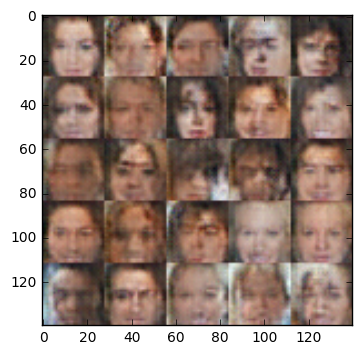

Epoch 1/1... Discriminator Loss: 1.4640... Generator Loss: 0.5805
Epoch 1/1... Discriminator Loss: 1.3745... Generator Loss: 0.6499
Epoch 1/1... Discriminator Loss: 1.4383... Generator Loss: 0.6984
Epoch 1/1... Discriminator Loss: 1.4497... Generator Loss: 0.6195
Epoch 1/1... Discriminator Loss: 1.3470... Generator Loss: 0.7923
Epoch 1/1... Discriminator Loss: 1.4574... Generator Loss: 0.7519
Epoch 1/1... Discriminator Loss: 0.8419... Generator Loss: 1.0330
Epoch 1/1... Discriminator Loss: 1.5830... Generator Loss: 0.5729
Epoch 1/1... Discriminator Loss: 1.5071... Generator Loss: 0.5883
Epoch 1/1... Discriminator Loss: 1.4397... Generator Loss: 0.5373


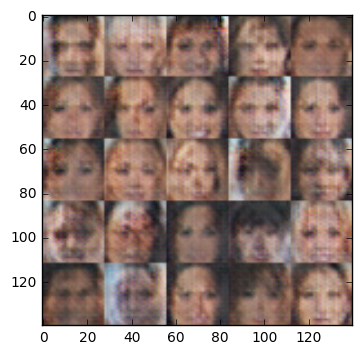

Epoch 1/1... Discriminator Loss: 1.4541... Generator Loss: 0.6410
Epoch 1/1... Discriminator Loss: 1.5417... Generator Loss: 0.6358
Epoch 1/1... Discriminator Loss: 1.4167... Generator Loss: 0.7603
Epoch 1/1... Discriminator Loss: 1.4105... Generator Loss: 0.6340
Epoch 1/1... Discriminator Loss: 1.5461... Generator Loss: 0.5475
Epoch 1/1... Discriminator Loss: 1.5128... Generator Loss: 0.7041
Epoch 1/1... Discriminator Loss: 1.3618... Generator Loss: 0.6879
Epoch 1/1... Discriminator Loss: 1.4573... Generator Loss: 0.6770
Epoch 1/1... Discriminator Loss: 1.4088... Generator Loss: 0.7655
Epoch 1/1... Discriminator Loss: 1.3989... Generator Loss: 0.6667


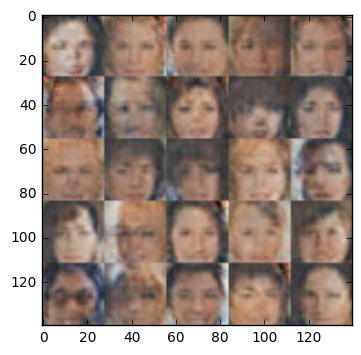

Epoch 1/1... Discriminator Loss: 1.4982... Generator Loss: 0.6310
Epoch 1/1... Discriminator Loss: 1.4980... Generator Loss: 0.6983
Epoch 1/1... Discriminator Loss: 1.4520... Generator Loss: 0.5846
Epoch 1/1... Discriminator Loss: 1.4412... Generator Loss: 0.6347
Epoch 1/1... Discriminator Loss: 1.4707... Generator Loss: 0.6457
Epoch 1/1... Discriminator Loss: 1.4034... Generator Loss: 0.6768
Epoch 1/1... Discriminator Loss: 1.4279... Generator Loss: 0.6203
Epoch 1/1... Discriminator Loss: 1.4307... Generator Loss: 0.7156
Epoch 1/1... Discriminator Loss: 1.4306... Generator Loss: 0.5848
Epoch 1/1... Discriminator Loss: 1.5218... Generator Loss: 0.5363


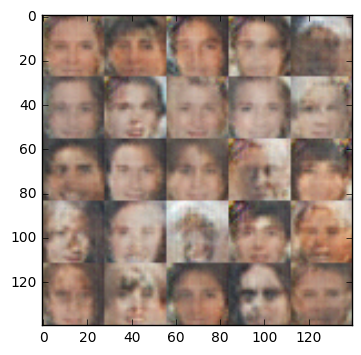

Epoch 1/1... Discriminator Loss: 1.4849... Generator Loss: 0.6923
Epoch 1/1... Discriminator Loss: 1.4984... Generator Loss: 0.5736
Epoch 1/1... Discriminator Loss: 1.3836... Generator Loss: 0.6171
Epoch 1/1... Discriminator Loss: 1.4330... Generator Loss: 0.6503
Epoch 1/1... Discriminator Loss: 1.3885... Generator Loss: 0.6234
Epoch 1/1... Discriminator Loss: 1.4437... Generator Loss: 0.6667
Epoch 1/1... Discriminator Loss: 1.4023... Generator Loss: 0.7343
Epoch 1/1... Discriminator Loss: 1.4127... Generator Loss: 0.6911
Epoch 1/1... Discriminator Loss: 1.3903... Generator Loss: 0.6991
Epoch 1/1... Discriminator Loss: 1.4871... Generator Loss: 0.5042


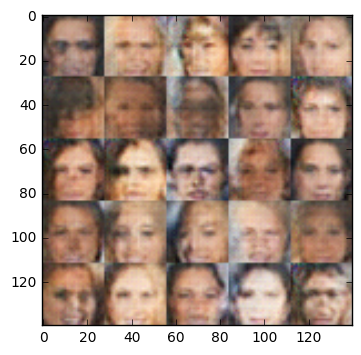

Epoch 1/1... Discriminator Loss: 1.4599... Generator Loss: 0.7522
Epoch 1/1... Discriminator Loss: 1.4256... Generator Loss: 0.6343
Epoch 1/1... Discriminator Loss: 1.4865... Generator Loss: 0.6257
Epoch 1/1... Discriminator Loss: 1.4370... Generator Loss: 0.7910
Epoch 1/1... Discriminator Loss: 1.4274... Generator Loss: 0.6342
Epoch 1/1... Discriminator Loss: 1.4319... Generator Loss: 0.4409
Epoch 1/1... Discriminator Loss: 1.7570... Generator Loss: 1.9105
Epoch 1/1... Discriminator Loss: 1.8210... Generator Loss: 0.4637
Epoch 1/1... Discriminator Loss: 1.4728... Generator Loss: 0.6707
Epoch 1/1... Discriminator Loss: 1.6044... Generator Loss: 0.5226


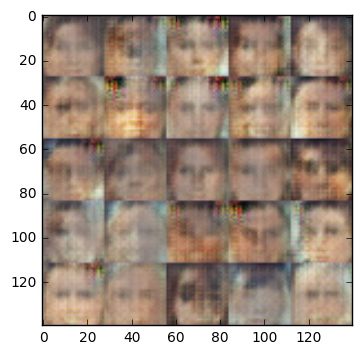

Epoch 1/1... Discriminator Loss: 1.5391... Generator Loss: 0.6903
Epoch 1/1... Discriminator Loss: 1.5118... Generator Loss: 0.6308
Epoch 1/1... Discriminator Loss: 1.4953... Generator Loss: 0.6679
Epoch 1/1... Discriminator Loss: 1.4788... Generator Loss: 0.5891
Epoch 1/1... Discriminator Loss: 1.4184... Generator Loss: 0.7344
Epoch 1/1... Discriminator Loss: 1.5497... Generator Loss: 0.6384
Epoch 1/1... Discriminator Loss: 1.4583... Generator Loss: 0.5692
Epoch 1/1... Discriminator Loss: 1.5453... Generator Loss: 0.5309
Epoch 1/1... Discriminator Loss: 1.4585... Generator Loss: 0.6518
Epoch 1/1... Discriminator Loss: 1.4612... Generator Loss: 0.6004


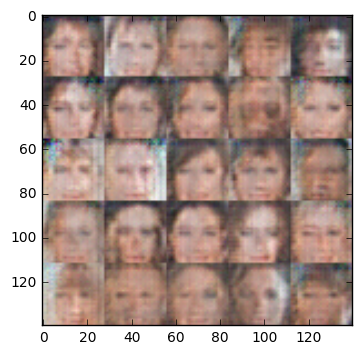

Epoch 1/1... Discriminator Loss: 1.4345... Generator Loss: 0.6965
Epoch 1/1... Discriminator Loss: 1.4824... Generator Loss: 0.7567
Epoch 1/1... Discriminator Loss: 1.4533... Generator Loss: 0.5842
Epoch 1/1... Discriminator Loss: 1.4227... Generator Loss: 0.6985
Epoch 1/1... Discriminator Loss: 1.4477... Generator Loss: 0.6244
Epoch 1/1... Discriminator Loss: 1.4804... Generator Loss: 0.6229
Epoch 1/1... Discriminator Loss: 1.4969... Generator Loss: 0.7070
Epoch 1/1... Discriminator Loss: 1.3830... Generator Loss: 0.6238
Epoch 1/1... Discriminator Loss: 1.4411... Generator Loss: 0.6472
Epoch 1/1... Discriminator Loss: 1.4481... Generator Loss: 0.6365


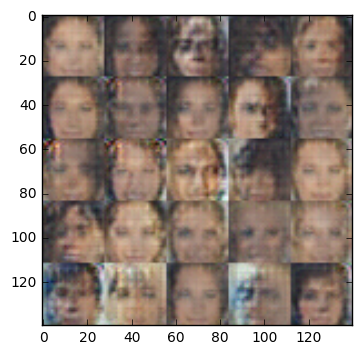

Epoch 1/1... Discriminator Loss: 1.3908... Generator Loss: 0.7318
Epoch 1/1... Discriminator Loss: 1.4307... Generator Loss: 0.5703
Epoch 1/1... Discriminator Loss: 1.5005... Generator Loss: 0.6174
Epoch 1/1... Discriminator Loss: 1.4067... Generator Loss: 0.7473
Epoch 1/1... Discriminator Loss: 1.4027... Generator Loss: 0.8017
Epoch 1/1... Discriminator Loss: 1.4407... Generator Loss: 0.6824
Epoch 1/1... Discriminator Loss: 1.4339... Generator Loss: 0.5972
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.6778
Epoch 1/1... Discriminator Loss: 1.3794... Generator Loss: 0.6775
Epoch 1/1... Discriminator Loss: 1.3893... Generator Loss: 0.7280


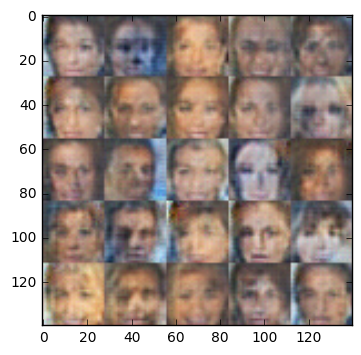

Epoch 1/1... Discriminator Loss: 1.4038... Generator Loss: 0.5915
Epoch 1/1... Discriminator Loss: 1.4008... Generator Loss: 0.6501
Epoch 1/1... Discriminator Loss: 1.4215... Generator Loss: 0.7169
Epoch 1/1... Discriminator Loss: 1.4039... Generator Loss: 0.5663
Epoch 1/1... Discriminator Loss: 1.4615... Generator Loss: 0.6927
Epoch 1/1... Discriminator Loss: 1.4544... Generator Loss: 0.5711
Epoch 1/1... Discriminator Loss: 1.4129... Generator Loss: 0.7262
Epoch 1/1... Discriminator Loss: 1.4163... Generator Loss: 0.5887
Epoch 1/1... Discriminator Loss: 1.4228... Generator Loss: 0.6986
Epoch 1/1... Discriminator Loss: 1.4104... Generator Loss: 0.7456


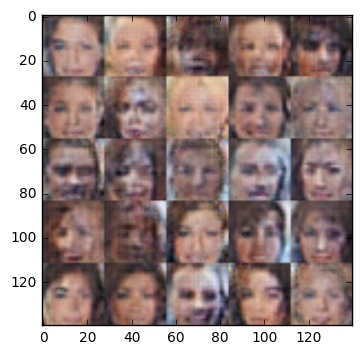

Epoch 1/1... Discriminator Loss: 1.3694... Generator Loss: 0.5868
Epoch 1/1... Discriminator Loss: 1.4270... Generator Loss: 0.6984
Epoch 1/1... Discriminator Loss: 1.4096... Generator Loss: 0.7167
Epoch 1/1... Discriminator Loss: 1.4741... Generator Loss: 0.6393
Epoch 1/1... Discriminator Loss: 1.4396... Generator Loss: 0.6271
Epoch 1/1... Discriminator Loss: 1.4691... Generator Loss: 0.6098
Epoch 1/1... Discriminator Loss: 1.3415... Generator Loss: 0.6752
Epoch 1/1... Discriminator Loss: 1.4291... Generator Loss: 0.7597
Epoch 1/1... Discriminator Loss: 1.4411... Generator Loss: 0.7184
Epoch 1/1... Discriminator Loss: 1.4150... Generator Loss: 0.6560


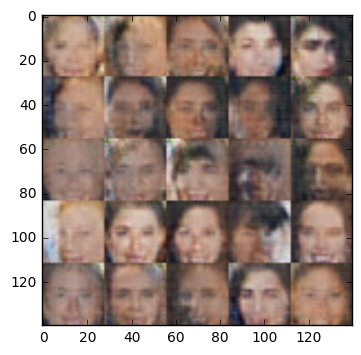

Epoch 1/1... Discriminator Loss: 1.4194... Generator Loss: 0.7527
Epoch 1/1... Discriminator Loss: 1.5056... Generator Loss: 0.6542
Epoch 1/1... Discriminator Loss: 1.4730... Generator Loss: 0.5887
Epoch 1/1... Discriminator Loss: 1.3841... Generator Loss: 0.6737
Epoch 1/1... Discriminator Loss: 1.4612... Generator Loss: 0.6363
Epoch 1/1... Discriminator Loss: 1.4474... Generator Loss: 0.6694
Epoch 1/1... Discriminator Loss: 1.4243... Generator Loss: 0.7370
Epoch 1/1... Discriminator Loss: 1.4191... Generator Loss: 0.5864
Epoch 1/1... Discriminator Loss: 1.4218... Generator Loss: 0.7665
Epoch 1/1... Discriminator Loss: 1.4037... Generator Loss: 0.5598


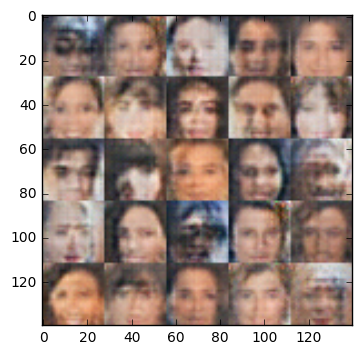

Epoch 1/1... Discriminator Loss: 1.4428... Generator Loss: 0.7962
Epoch 1/1... Discriminator Loss: 1.3972... Generator Loss: 0.6507
Epoch 1/1... Discriminator Loss: 1.4329... Generator Loss: 0.6156
Epoch 1/1... Discriminator Loss: 1.4779... Generator Loss: 0.6899
Epoch 1/1... Discriminator Loss: 1.4239... Generator Loss: 0.6839
Epoch 1/1... Discriminator Loss: 1.4155... Generator Loss: 0.7905
Epoch 1/1... Discriminator Loss: 1.4882... Generator Loss: 0.5681
Epoch 1/1... Discriminator Loss: 1.4255... Generator Loss: 0.7942
Epoch 1/1... Discriminator Loss: 1.4311... Generator Loss: 0.6679
Epoch 1/1... Discriminator Loss: 1.4494... Generator Loss: 0.6537


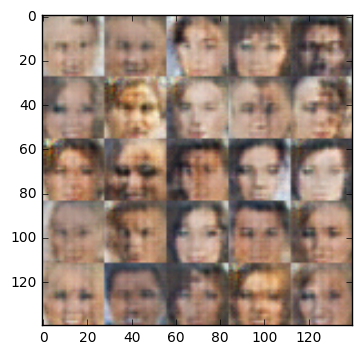

Epoch 1/1... Discriminator Loss: 1.4235... Generator Loss: 0.7264
Epoch 1/1... Discriminator Loss: 1.4665... Generator Loss: 0.6847
Epoch 1/1... Discriminator Loss: 1.4184... Generator Loss: 0.6345
Epoch 1/1... Discriminator Loss: 1.4014... Generator Loss: 0.7207
Epoch 1/1... Discriminator Loss: 1.4303... Generator Loss: 0.7587
Epoch 1/1... Discriminator Loss: 1.4077... Generator Loss: 0.6008
Epoch 1/1... Discriminator Loss: 1.4507... Generator Loss: 0.6982
Epoch 1/1... Discriminator Loss: 1.4376... Generator Loss: 0.7054
Epoch 1/1... Discriminator Loss: 1.4280... Generator Loss: 0.6516
Epoch 1/1... Discriminator Loss: 1.4217... Generator Loss: 0.7164


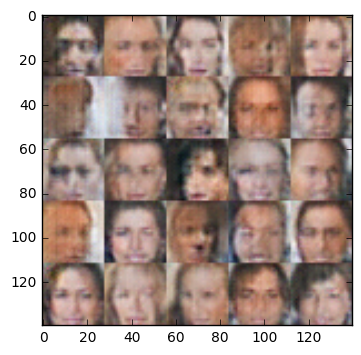

Epoch 1/1... Discriminator Loss: 1.4621... Generator Loss: 0.5559
Epoch 1/1... Discriminator Loss: 1.3866... Generator Loss: 0.6839
Epoch 1/1... Discriminator Loss: 1.4138... Generator Loss: 0.7394
Epoch 1/1... Discriminator Loss: 1.4284... Generator Loss: 0.7435
Epoch 1/1... Discriminator Loss: 1.3960... Generator Loss: 0.6426
Epoch 1/1... Discriminator Loss: 1.4033... Generator Loss: 0.7001
Epoch 1/1... Discriminator Loss: 1.4324... Generator Loss: 0.7357
Epoch 1/1... Discriminator Loss: 1.4513... Generator Loss: 0.5359
Epoch 1/1... Discriminator Loss: 1.4440... Generator Loss: 0.7508
Epoch 1/1... Discriminator Loss: 1.4154... Generator Loss: 0.6065


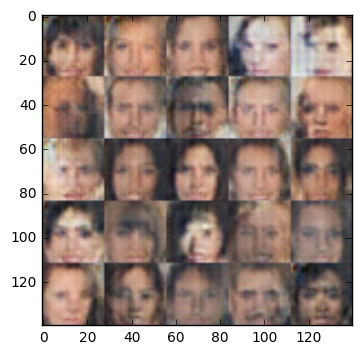

Epoch 1/1... Discriminator Loss: 1.4179... Generator Loss: 0.6433
Epoch 1/1... Discriminator Loss: 1.4682... Generator Loss: 0.7204
Epoch 1/1... Discriminator Loss: 1.4120... Generator Loss: 0.6497
Epoch 1/1... Discriminator Loss: 1.4515... Generator Loss: 0.6669
Epoch 1/1... Discriminator Loss: 1.4152... Generator Loss: 0.6612
Epoch 1/1... Discriminator Loss: 1.5376... Generator Loss: 0.4604
Epoch 1/1... Discriminator Loss: 1.4239... Generator Loss: 0.6679
Epoch 1/1... Discriminator Loss: 1.4408... Generator Loss: 0.7283
Epoch 1/1... Discriminator Loss: 1.4226... Generator Loss: 0.6872
Epoch 1/1... Discriminator Loss: 1.4441... Generator Loss: 0.6939


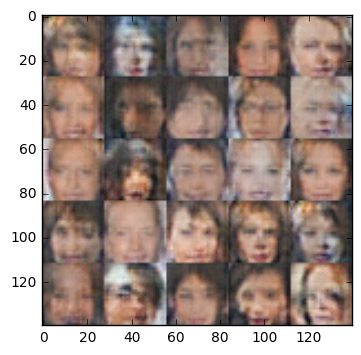

Epoch 1/1... Discriminator Loss: 1.4102... Generator Loss: 0.7192
Epoch 1/1... Discriminator Loss: 1.4437... Generator Loss: 0.5972
Epoch 1/1... Discriminator Loss: 1.4284... Generator Loss: 0.6736
Epoch 1/1... Discriminator Loss: 1.4340... Generator Loss: 0.6374
Epoch 1/1... Discriminator Loss: 1.3970... Generator Loss: 0.6474
Epoch 1/1... Discriminator Loss: 1.4128... Generator Loss: 0.7396
Epoch 1/1... Discriminator Loss: 1.4610... Generator Loss: 0.7402
Epoch 1/1... Discriminator Loss: 1.3945... Generator Loss: 0.6121
Epoch 1/1... Discriminator Loss: 1.4265... Generator Loss: 0.6556
Epoch 1/1... Discriminator Loss: 1.4134... Generator Loss: 0.6935


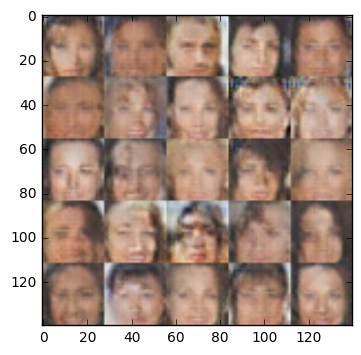

Epoch 1/1... Discriminator Loss: 1.3742... Generator Loss: 0.6991
Epoch 1/1... Discriminator Loss: 1.4635... Generator Loss: 0.6513
Epoch 1/1... Discriminator Loss: 1.4034... Generator Loss: 0.7078
Epoch 1/1... Discriminator Loss: 1.4311... Generator Loss: 0.7148
Epoch 1/1... Discriminator Loss: 1.4199... Generator Loss: 0.7553
Epoch 1/1... Discriminator Loss: 1.4368... Generator Loss: 0.6298


In [13]:
batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.